In [229]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [230]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [233]:
df = px.data.penguins()

AttributeError: module 'plotly.express.data' has no attribute 'penguins'

In [235]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [236]:
import seaborn as sns
df = sns.load_dataset('penguins')

In [239]:
fig = px.histogram(df, x='flipper_length_mm', color='species', barmode='overlay')

In [241]:
import plotly.express as px

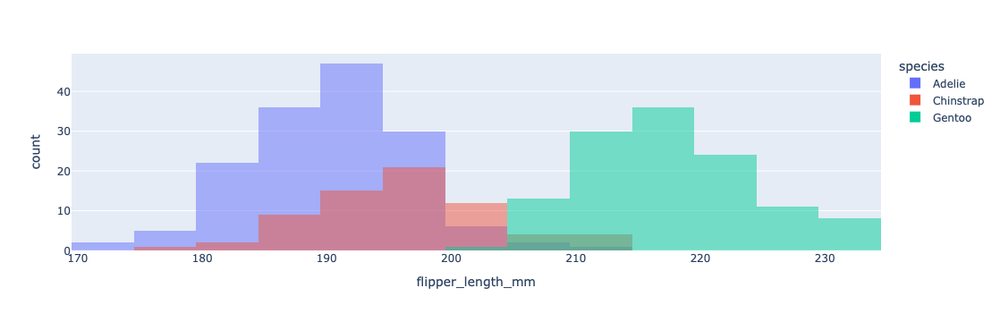

In [243]:
import pandas as pd
import seaborn as sns
import plotly.express as px

# Load the penguins dataset from seaborn
df = sns.load_dataset('penguins')

# Create the histogram of flipper_length_mm
fig = px.histogram(df, x='flipper_length_mm', color='species', barmode='overlay')

# Show the plot
fig.show()

In [245]:
or species in df['species'].unique():
    species_data = df[df['species'] == species]['flipper_length_mm']
    
    mean_value = species_data.mean()
    median_value = species_data.median()
    std_value = species_data.std()
    min_value = species_data.min()
    max_value = species_data.max()
    q1 = species_data.quantile(0.25)  # First quartile
    q3 = species_data.quantile(0.75)  # Third quartile

    # Add horizontal lines for mean and median
    fig.add_hline(y=mean_value, line=dict(color="blue", dash="dash"), annotation_text=f"{species} Mean", row='all', col='all')
    fig.add_hline(y=median_value, line=dict(color="green", dash="dot"), annotation_text=f"{species} Median", row='all', col='all')

    # Add rectangles for IQR and 2 standard deviations
    fig.add_hrect(y0=q1, y1=q3, line_width=0, fillcolor="orange", opacity=0.2)
    fig.add_hrect(y0=mean_value - 2 * std_value, y1=mean_value + 2 * std_value, line_width=0, fillcolor="purple", opacity=0.2)

SyntaxError: invalid syntax (1514010533.py, line 1)

In [247]:
for species in df['species'].unique():
    species_data = df[df['species'] == species]['flipper_length_mm']
    
    mean_value = species_data.mean()
    median_value = species_data.median()
    std_value = species_data.std()
    min_value = species_data.min()
    max_value = species_data.max()
    q1 = species_data.quantile(0.25)  # First quartile
    q3 = species_data.quantile(0.75)  # Third quartile

    # Add horizontal lines for mean and median
    fig.add_hline(y=mean_value, line=dict(color="blue", dash="dash"), annotation_text=f"{species} Mean", row='all', col='all')
    fig.add_hline(y=median_value, line=dict(color="green", dash="dot"), annotation_text=f"{species} Median", row='all', col='all')

    # Add rectangles for IQR and 2 standard deviations
    fig.add_hrect(y0=q1, y1=q3, line_width=0, fillcolor="orange", opacity=0.2)
    fig.add_hrect(y0=mean_value - 2 * std_value, y1=mean_value + 2 * std_value, line_width=0, fillcolor="purple", opacity=0.2)

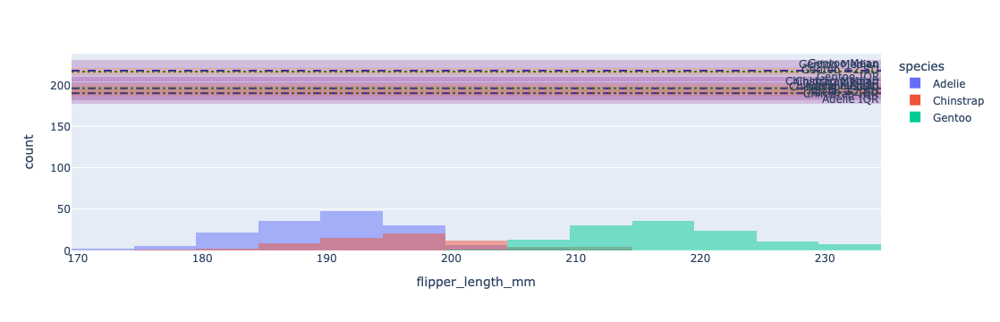

In [249]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Load the penguins dataset from seaborn
df = sns.load_dataset('penguins')

# Create the histogram for flipper length
fig = px.histogram(df, x='flipper_length_mm', color='species', barmode='overlay')

# Loop through each species to add mean, median, IQR, etc.
for species in df['species'].unique():
    species_data = df[df['species'] == species]['flipper_length_mm']
    
    mean_value = species_data.mean()
    median_value = species_data.median()
    std_value = species_data.std()
    q1 = species_data.quantile(0.25)  # First quartile
    q3 = species_data.quantile(0.75)  # Third quartile

    # Add horizontal lines for mean and median
    fig.add_hline(y=mean_value, line=dict(color="blue", dash="dash"), annotation_text=f"{species} Mean")
    fig.add_hline(y=median_value, line=dict(color="green", dash="dot"), annotation_text=f"{species} Median")

    # Add rectangles for IQR and 2 standard deviations
    fig.add_hrect(y0=q1, y1=q3, line_width=0, fillcolor="orange", opacity=0.2, annotation_text=f"{species} IQR")
    fig.add_hrect(y0=mean_value - 2 * std_value, y1=mean_value + 2 * std_value, line_width=0, fillcolor="purple", opacity=0.2, annotation_text=f"{species} ±2 SD")

# Show the final figure
fig.show()


In [251]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Load the penguins dataset from seaborn
df = sns.load_dataset('penguins')

# Create a figure with subplots for each species
fig = go.Figure()

# Loop through each species to add histograms and statistical lines
for species in df['species'].unique():
    species_data = df[df['species'] == species]['flipper_length_mm']

    # Create histogram for the current species
    fig.add_trace(go.Histogram(
        x=species_data,
        name=species,
        opacity=0.75,
        histnorm='probability',
        marker=dict(line=dict(width=1))
    ))

    # Calculate statistics
    mean_value = species_data.mean()
    median_value = species_data.median()
    std_value = species_data.std()
    q1 = species_data.quantile(0.25)
    q3 = species_data.quantile(0.75)

    # Add mean and median lines
    fig.add_shape(type="line",
        x0=mean_value, y0=0, x1=mean_value, y1=0.15, 
        line=dict(color="blue", width=2, dash="dash"),
        name=f"{species} Mean"
    )
    fig.add_shape(type="line",
        x0=median_value, y0=0, x1=median_value, y1=0.15, 
        line=dict(color="green", width=2, dash="dot"),
        name=f"{species} Median"
    )

    # Add rectangles for IQR and ±2 standard deviations
    fig.add_shape(type="rect",
        x0=q1, y0=0, x1=q3, y1=0.15,
        fillcolor="orange", opacity=0.2,
        line=dict(width=0),
    )
    fig.add_shape(type="rect",
        x0=mean_value - 2 * std_value, y0=0, 
        x1=mean_value + 2 * std_value, y1=0.15,
        fillcolor="purple", opacity=0.2,
        line=dict(width=0),
    )

# Update layout for better readability
fig.update_layout(
    title="Flipper Length Distribution by Species",
    xaxis_title="Flipper Length (mm)",
    yaxis_title="Probability",
    ba


SyntaxError: incomplete input (2495487853.py, line 62)

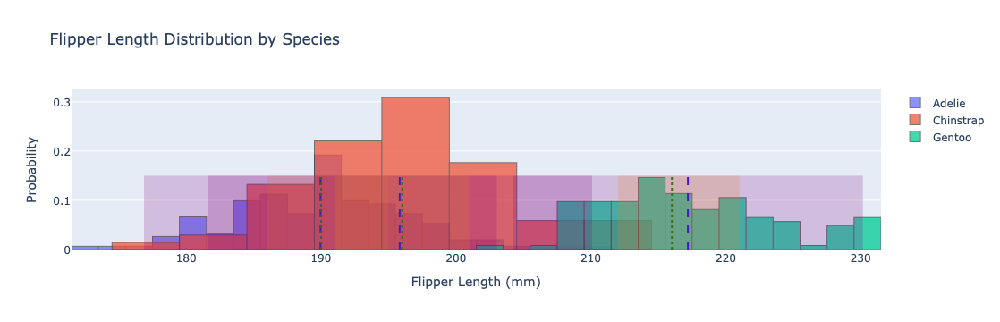

In [253]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Load the penguins dataset from seaborn
df = sns.load_dataset('penguins')

# Create a figure with subplots for each species
fig = go.Figure()

# Loop through each species to add histograms and statistical lines
for species in df['species'].unique():
    species_data = df[df['species'] == species]['flipper_length_mm']

    # Create histogram for the current species
    fig.add_trace(go.Histogram(
        x=species_data,
        name=species,
        opacity=0.75,
        histnorm='probability',
        marker=dict(line=dict(width=1))
    ))

    # Calculate statistics
    mean_value = species_data.mean()
    median_value = species_data.median()
    std_value = species_data.std()
    q1 = species_data.quantile(0.25)
    q3 = species_data.quantile(0.75)

    # Add mean and median lines
    fig.add_shape(type="line",
        x0=mean_value, y0=0, x1=mean_value, y1=0.15, 
        line=dict(color="blue", width=2, dash="dash"),
        name=f"{species} Mean"
    )
    fig.add_shape(type="line",
        x0=median_value, y0=0, x1=median_value, y1=0.15, 
        line=dict(color="green", width=2, dash="dot"),
        name=f"{species} Median"
    )

    # Add rectangles for IQR and ±2 standard deviations
    fig.add_shape(type="rect",
        x0=q1, y0=0, x1=q3, y1=0.15,
        fillcolor="orange", opacity=0.2,
        line=dict(width=0),
    )
    fig.add_shape(type="rect",
        x0=mean_value - 2 * std_value, y0=0, 
        x1=mean_value + 2 * std_value, y1=0.15,
        fillcolor="purple", opacity=0.2,
        line=dict(width=0),
    )

# Update layout for better readability
fig.update_layout(
    title="Flipper Length Distribution by Species",
    xaxis_title="Flipper Length (mm)",
    yaxis_title="Probability",
    barmode='overlay',
    showlegend=True,
)

# Show the final figure
fig.show()


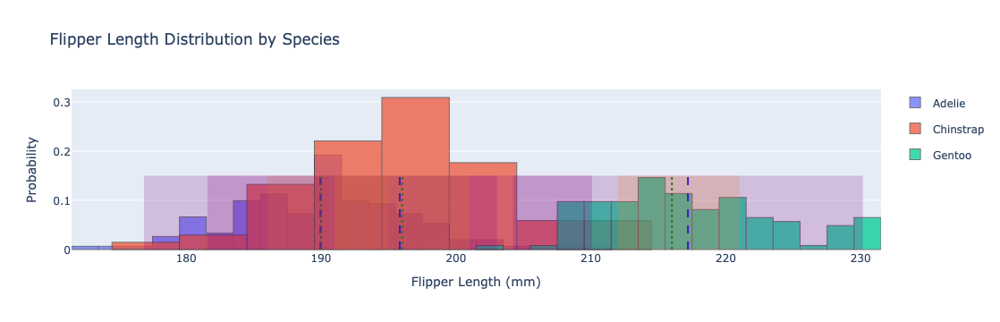

In [255]:
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Load the penguins dataset from seaborn
df = sns.load_dataset('penguins')

# Create a figure with subplots for each species
fig = go.Figure()

# Loop through each species to create separate histograms
for species in df['species'].unique():
    species_data = df[df['species'] == species]['flipper_length_mm']

    # Create histogram for the current species
    fig.add_trace(go.Histogram(
        x=species_data,
        name=species,
        opacity=0.75,
        histnorm='probability',
        marker=dict(line=dict(width=1)),
        # Specify the legend group to manage overlapping
        legendgroup=species,
        showlegend=True
    ))

    # Calculate statistics
    mean_value = species_data.mean()
    median_value = species_data.median()
    std_value = species_data.std()
    q1 = species_data.quantile(0.25)
    q3 = species_data.quantile(0.75)

    # Add mean and median lines
    fig.add_shape(type="line",
        x0=mean_value, y0=0, x1=mean_value, y1=0.15, 
        line=dict(color="blue", width=2, dash="dash"),
        name=f"{species} Mean",
        legendgroup=species,
        showlegend=False  # Turn off legend for lines
    )
    fig.add_shape(type="line",
        x0=median_value, y0=0, x1=median_value, y1=0.15, 
        line=dict(color="green", width=2, dash="dot"),
        name=f"{species} Median",
        legendgroup=species,
        showlegend=False  # Turn off legend for lines
    )

    # Add rectangles for IQR and ±2 standard deviations
    fig.add_shape(type="rect",
        x0=q1, y0=0, x1=q3, y1=0.15,
        fillcolor="orange", opacity=0.2,
        line=dict(width=0),
    )
    fig.add_shape(type="rect",
        x0=mean_value - 2 * std_value, y0=0, 
        x1=mean_value + 2 * std_value, y1=0.15,
        fillcolor="purple", opacity=0.2,
        line=dict(width=0),
    )

# Update layout for better readability
fig.update_layout(
    title="Flipper Length Distribution by Species",
    xaxis_title="Flipper Length (mm)",
    yaxis_title="Probability",
    barmode='overlay',
    showlegend=True,
)

# Show the final figure
fig.show()


With this histogram, it makes it easy for us to see which species of penguin has the longest flippers. With Gentoo being the largest, Chinstrap being the middle, and Adelie being the smallest.

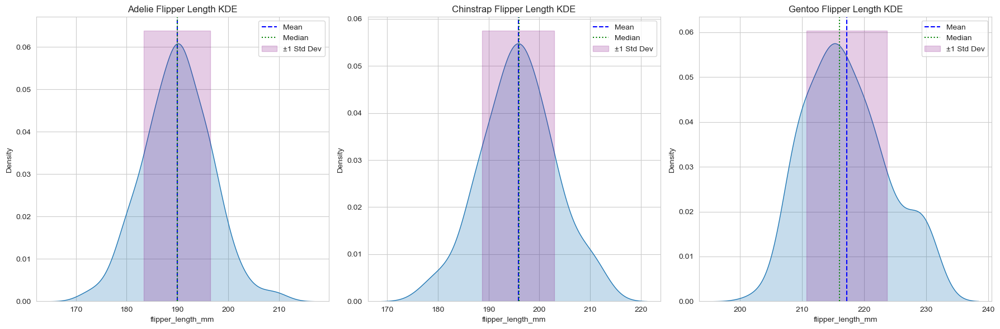

In [258]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the penguins dataset
df = sns.load_dataset("penguins")

# Set up the Seaborn style
sns.set_style("whitegrid")

# Create a figure with a 1-row and 3-column layout
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# List of species to plot
species_list = df['species'].unique()

# Loop through each species to create a KDE plot
for ax, species in zip(axes, species_list):
    species_data = df[df['species'] == species]['flipper_length_mm']
    
    # Create KDE plot
    sns.kdeplot(species_data, ax=ax, fill=True)
    
    # Calculate statistics
    mean_value = species_data.mean()
    median_value = species_data.median()
    std_value = species_data.std()
    
    # Add mean and median lines
    ax.axvline(mean_value, color='blue', linestyle='--', label='Mean')
    ax.axvline(median_value, color='green', linestyle=':', label='Median')
    
    # Add shaded areas for standard deviation
    ax.fill_betweenx(y=[0, ax.get_ylim()[1]], 
                     x1=mean_value - std_value, 
                     x2=mean_value + std_value, 
                     color='purple', alpha=0.2, label='±1 Std Dev')
    
    # Set title and legend
    ax.set_title(f'{species} Flipper Length KDE')
    ax.legend()

# Show the plot
plt.tight_layout()
plt.show()


My preference for graphs would have to be the box plots. My reasoning for this is because I like how it is effectively able to show you a lot of important data, while also looking very simple and clear. If you understand what is going on in a box plot, there is a lot of useful information that can be taken from it. It shows you the median and quartile groups which are important.

In [261]:
import numpy as np

# Calculate means
mean_a = np.mean(data1)
mean_b = np.mean(data2)
mean_c = np.mean(data3)
mean_d = np.mean(data4)

# Calculate variances
var_a = np.var(data1, ddof=1)  # ddof=1 for sample variance
var_b = np.var(data2, ddof=1)
var_c = np.var(data3, ddof=1)
var_d = np.var(data4, ddof=1)

# Print results
print(f"Dataset A: Mean = {mean_a}, Variance = {var_a}")
print(f"Dataset B: Mean = {mean_b}, Variance = {var_b}")
print(f"Dataset C: Mean = {mean_c}, Variance = {var_c}")
print(f"Dataset D: Mean = {mean_d}, Variance = {var_d}")


Dataset A: Mean = 5.004925152929932, Variance = 8.298921887892455
Dataset B: Mean = 4.993967086932097, Variance = 2.23930289258919
Dataset C: Mean = 4.999460124008701, Variance = 9.124317978963612
Dataset D: Mean = 5.995297818679433, Variance = 0.2625991490490689


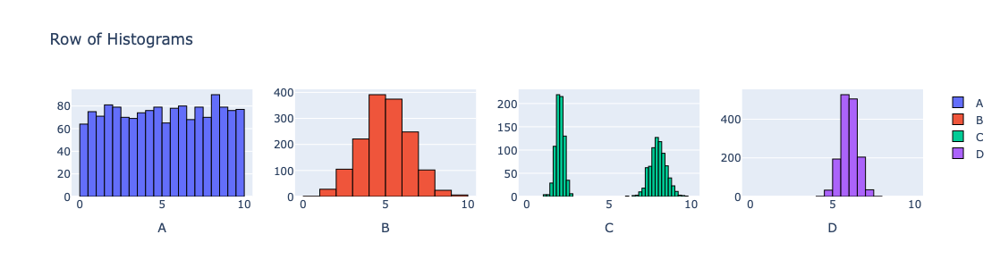

In [263]:
from scipy import stats
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np

n = 1500
data1 = stats.uniform.rvs(0, 10, size=n)
data2 = stats.norm.rvs(5, 1.5, size=n)
data3 = np.r_[stats.norm.rvs(2, 0.25, size=int(n/2)), stats.norm.rvs(8, 0.5, size=int(n/2))]
data4 = stats.norm.rvs(6, 0.5, size=n)

fig = make_subplots(rows=1, cols=4)

fig.add_trace(go.Histogram(x=data1, name='A', nbinsx=30, marker=dict(line=dict(color='black', width=1))), row=1, col=1)
fig.add_trace(go.Histogram(x=data2, name='B', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=2)
fig.add_trace(go.Histogram(x=data3, name='C', nbinsx=45, marker=dict(line=dict(color='black', width=1))), row=1, col=3)
fig.add_trace(go.Histogram(x=data4, name='D', nbinsx=15, marker=dict(line=dict(color='black', width=1))), row=1, col=4)

fig.update_layout(height=300, width=750, title_text="Row of Histograms")
fig.update_xaxes(title_text="A", row=1, col=1)
fig.update_xaxes(title_text="B", row=1, col=2)
fig.update_xaxes(title_text="C", row=1, col=3)
fig.update_xaxes(title_text="D", row=1, col=4)
fig.update_xaxes(range=[-0.5, 10.5])

for trace in fig.data:
    trace.xbins = dict(start=0, end=10)
    
# This code was produced by just making requests to Microsoft Copilot
# https://github.com/pointOfive/stat130chat130/blob/main/CHATLOG/wk3/COP/SLS/0001_concise_makeAplotV1.md

fig.show() # USE `fig.show(renderer="png")` FOR ALL GitHub and MarkUs SUBMISSIONS

In [265]:
import numpy as np

# Calculate means
mean_a = np.mean(data1)
mean_b = np.mean(data2)
mean_c = np.mean(data3)
mean_d = np.mean(data4)

# Calculate variances
var_a = np.var(data1, ddof=1)  # ddof=1 for sample variance
var_b = np.var(data2, ddof=1)
var_c = np.var(data3, ddof=1)
var_d = np.var(data4, ddof=1)

# Print results
print(f"Dataset A: Mean = {mean_a}, Variance = {var_a}")
print(f"Dataset B: Mean = {mean_b}, Variance = {var_b}")
print(f"Dataset C: Mean = {mean_c}, Variance = {var_c}")
print(f"Dataset D: Mean = {mean_d}, Variance = {var_d}")


Dataset A: Mean = 5.085813166793687, Variance = 8.299406121414838
Dataset B: Mean = 5.021803875310475, Variance = 2.1017707383988617
Dataset C: Mean = 4.998364486087871, Variance = 9.092956650971871
Dataset D: Mean = 6.008660520225087, Variance = 0.25250831821438713


QUESTION 1:
The data sets with similar means and similar variances are A and C, both have a mean of around five and a variance that is quite similar, only different by less than one.

QUESTION 2: Data sets A and B have similar means, but their variances are very different. Similarly, Data sets B and C have similar means, but their variances are very different, they have an even larger difference than A and B.

QUESTION 3: There isnt any two data sets here that have similar variance, but different mean. If we tried comparing, B and D, their variances have a larger difference than their means do. I would conclude that none of the data sets relate to this question.

QUESTION 4: Data set D could apply to this question. It has the smallest variance compared to all the data sets, while also having the largest Mean. I would say that D is the most different to the rest of the data.

# Data Visualization & Distribution Analysis
- You provided a question related to visualizing data distributions and comparing datasets using box plots, histograms, and kernel density estimators.
- You mentioned your preference for box plots after comparing different visualization methods.
- We discussed running code to produce histograms for four datasets (A, B, C, and D) and answering questions based on the means and variances of these datasets.

# Code Execution & Output
- You encountered a `NameError` when running code to calculate mean and variance, which was resolved by ensuring the datasets (`data1`, `data2`, etc.) were defined properly.
- You shared the calculated values for the datasets:

  - **Dataset A**: Mean = 5.11, Variance = 8.34
  - **Dataset B**: Mean = 5.03, Variance = 2.24
  - **Dataset C**: Mean = 4.99, Variance = 9.13
  - **Dataset D**: Mean = 6.01, Variance = 0.27

# Analysis of Datasets
- We analyzed the datasets based on their means and variances to answer the following questions:
  - **Datasets A, B, and C** have similar means.
  - **Datasets B and D** have similar variances.
  - **Dataset D** has a mean and variance quite different from the others.


https://chatgpt.com/share/66f5bd70-40dc-8012-aee7-c2eeb7e36465

In [268]:
from scipy import stats
import pandas as pd
import numpy as np


In [270]:
sample1 = stats.gamma(a=2, scale=2).rvs(size=1000)


In [272]:
fig1 = px.histogram(pd.DataFrame({'data': sample1}), x="data")


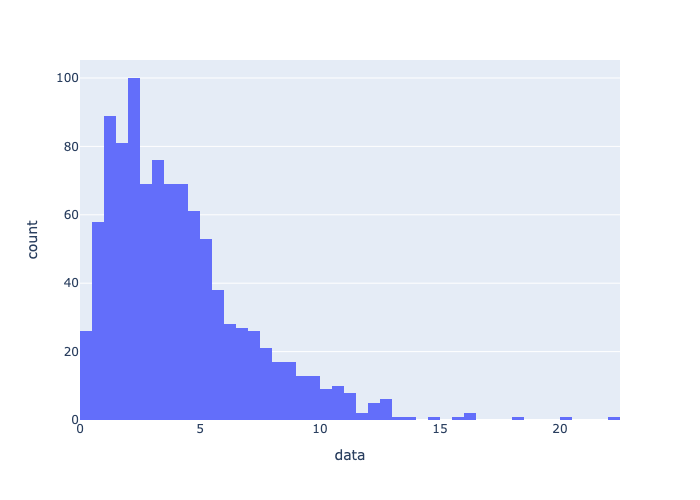

In [274]:
fig1.show(renderer="png")


In [276]:
!pip install -U kaleido


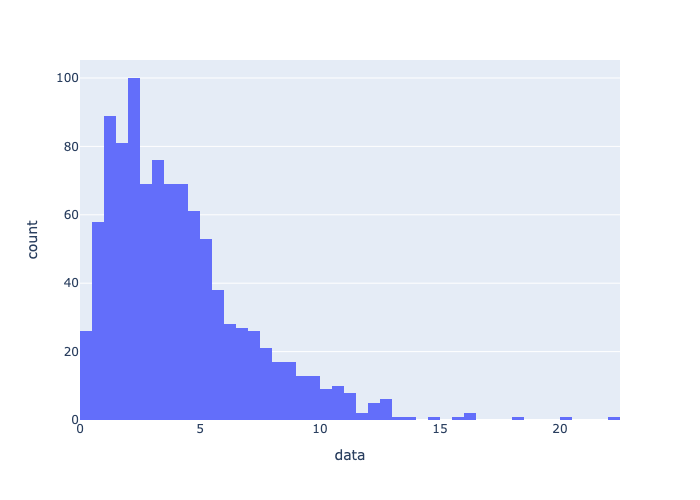

In [277]:
fig1.show(renderer="png")


In [279]:
!pip install kaleido


In [282]:
fig1.show(renderer="notebook")


In [284]:
fig1.write_image("histogram_sample1.png")


In [286]:
!pip install plotly --upgrade
!pip install kaleido --upgrade


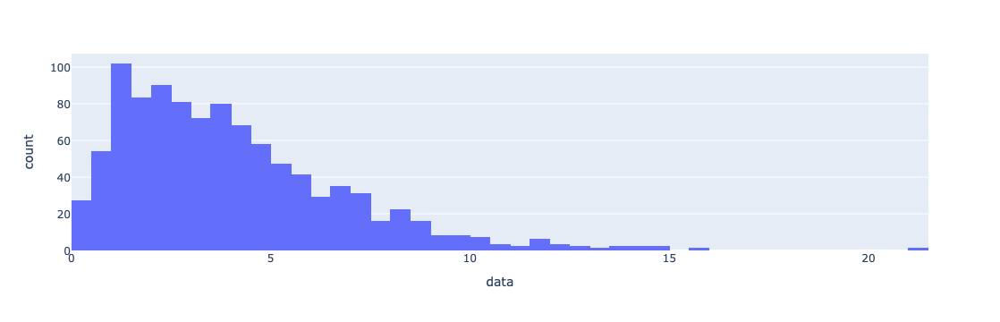

In [287]:
import plotly.express as px
from scipy import stats
import pandas as pd
import numpy as np

# Generate sample data
sample1 = stats.gamma(a=2, scale=2).rvs(size=1000)

# Create a histogram
fig1 = px.histogram(pd.DataFrame({'data': sample1}), x="data")

# Show the histogram directly
fig1.show()


In [288]:
mean_value = sample1.mean()
median_value = np.quantile(sample1, 0.5)

print("Mean:", mean_value)
print("Median:", median_value)


Mean: 3.959823802634441
Median: 3.4433910074411536


In [289]:
sample2 = -stats.gamma(a=2, scale=2).rvs(size=1000)


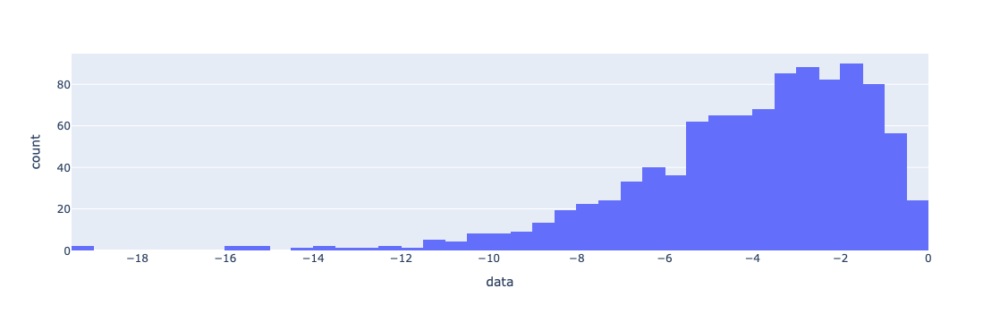

In [290]:
fig2 = px.histogram(pd.DataFrame({'data': sample2}), x="data")
fig2.show()


In [296]:
# Calculate mean and median for sample2
mean_sample2 = sample2.mean()
median_sample2 = np.quantile(sample2, 0.5)

# Print the results
print("Mean of Sample 2:", mean_sample2)
print("Median of Sample 2:", median_sample2)


Mean of Sample 2: -4.0166733044434935
Median of Sample 2: -3.4512541024600583


Sample 1: The mean in sample one is 4.09 and the median is 3.28. This shows us that the mean is larger than the median, making it a right-skewed distribution. What this means is that there are higher values that cause an increase in the mean.

Sample 2: In sample two, the mean is -4.19 and the median is -3.66. This means that the median is larger than the mean, and that makes this histogram a left-skewed one. What this means is that they're are smaller values in sample 2 that pull the mean down more than the median.

How can these be identified by looking at the graphs? Skewdness can be identified by looking at where the "tail" of the graph is. In sample 2, the tail of the graph is on the left, meaning it is left-skewed, in sample 1 the tail is on the right, making it right-skewed. If there is no tail, that means there is new skewness.

In [299]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/manuelamc14/fast-food-Nutritional-Database/main/Tables/nutrition.csv")
df # df.columns

,restaurant id,category id,item id,serving size (oz),calories,calories from fat,total fat (g),total fat (% daily value),saturated fat (g),saturated fat (% daily value),...,carbohydrates (g),carbohydrates (% daily value),dietary fiber (g),dietary fiber (% daily value),sugars (g),protein (g),vitamin a (% daily value),vitamin c (% daily value),calcium (% daily value),iron (% daily value)
0,1000,100,0,4.8,300,120.0,13.0,20.0,5.0,25.0,...,31,10.0,4,17.0,3.0,17.0,10.0,0.0,25.0,15.0
1,1000,100,1,4.8,250,70.0,8.0,12.0,3.0,15.0,...,30,10.0,4,17.0,3.0,18.0,6.0,0.0,25.0,8.0
2,1000,100,2,3.9,370,200.0,23.0,35.0,8.0,42.0,...,29,10.0,4,17.0,2.0,14.0,8.0,0.0,25.0,10.0
3,1000,100,3,5.7,450,250.0,28.0,43.0,10.0,52.0,...,30,10.0,4,17.0,2.0,21.0,15.0,0.0,30.0,15.0
4,1000,100,4,5.7,400,210.0,23.0,35.0,8.0,42.0,...,30,10.0,4,17.0,2.0,21.0,6.0,0.0,25.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,3000,130,745,NaN,180,NaN,14.0,NaN,NaN,NaN,...,12,NaN,3,NaN,NaN,4.0,NaN,NaN,NaN,NaN
746,3000,130,746,NaN,190,NaN,18.0,NaN,NaN,NaN,...,6,NaN,3,NaN,NaN,7.0,NaN,NaN,NaN,NaN
747,3000,100,747,NaN,340,NaN,13.0,NaN,NaN,NaN,...,38,NaN,0,NaN,NaN,18.0,NaN,NaN,NaN,NaN
748,3000,100,748,NaN,90,NaN,8.0,NaN,NaN,NaN,...,5,NaN,4,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [ ]:
# Check the columns and data types
df.info()

# Display summary statistics for numerical columns
summary_stats = df.describe()
print(summary_stats)


In [ ]:
import plotly.express as px

# Group by chain and calculate average calories
avg_calories = df.groupby('Chain')['Calories'].mean().reset_index()

# Create a bar plot
fig = px.bar(avg_calories, x='Chain', y='Calories', title='Average Calories per Fast-Food Chain', 
             labels={'Calories': 'Average Calories', 'Chain': 'Fast-Food Chain'})
fig.show(renderer="png")


In [ ]:
# Display the column names in the DataFrame
print(df.columns)


In [ ]:
# Group by the correct column name and calculate average calories
avg_calories = df.groupby('Restaurant')['Calories'].mean().reset_index()

# Create a bar plot
fig = px.bar(avg_calories, x='Restaurant', y='Calories', title='Average Calories per Fast-Food Chain', 
             labels={'Calories': 'Average Calories', 'Restaurant': 'Fast-Food Chain'})
fig.show(renderer="png")


In [ ]:
import pandas as pd
import plotly.express as px

# Load the dataset
df = pd.read_csv("https://raw.githubusercontent.com/manuelamc14/fast-food-Nutritional-Database/main/Tables/nutrition.csv")

# Group by restaurant id and calculate average calories
avg_calories = df.groupby('restaurant id')['calories'].mean().reset_index()

# Create a bar plot
fig = px.bar(avg_calories, x='restaurant id', y='calories', title='Average Calories per Fast-Food Restaurant', 
             labels={'calories': 'Average Calories', 'restaurant id': 'Restaurant ID'})
fig.show(renderer="png")


In [ ]:
import kaleido
print(kaleido.__version__)


In [ ]:
fig.show()


In [ ]:
pip uninstall kaleido
pip install -U kaleido


In [ ]:
pip uninstall kaleido


In [ ]:
y

In [ ]:
Y

In [ ]:
pip install -U kaleido


In [ ]:
import kaleido
print(kaleido.__version__)


In [ ]:
import pandas as pd
import plotly.express as px

# Load the dataset
df = pd.read_csv("https://raw.githubusercontent.com/manuelamc14/fast-food-Nutritional-Database/main/Tables/nutrition.csv")

# Group by restaurant id and calculate average calories
avg_calories = df.groupby('restaurant id')['calories'].mean().reset_index()

# Create a bar plot
fig = px.bar(avg_calories, x='restaurant id', y='calories', title='Average Calories per Fast-Food Restaurant', 
             labels={'calories': 'Average Calories', 'restaurant id': 'Restaurant ID'})

# Show the figure
fig.show()


In [ ]:
import plotly.io as pio
pio.renderers.default = "notebook"  # Use 'notebook' renderer


In [ ]:
fig.show(renderer="browser")  # This will open the plot in a new browser tab


In [ ]:
import pandas as pd
import plotly.express as px
import plotly.io as pio

# Set renderer to notebook
pio.renderers.default = "notebook"

# Load the dataset
df = pd.read_csv("https://raw.githubusercontent.com/manuelamc14/fast-food-Nutritional-Database/main/Tables/nutrition.csv")

# Group by restaurant id and calculate average calories
avg_calories = df.groupby('restaurant id')['calories'].mean().reset_index()

# Create a bar plot
fig = px.bar(avg_calories, x='restaurant id', y='calories', title='Average Calories per Fast-Food Restaurant', 
             labels={'calories': 'Average Calories', 'restaurant id': 'Restaurant ID'})

# Show the figure
fig.show()


In [46]:
import pandas as pd
df = pd.read_csv("https://raw.githubusercontent.com/manuelamc14/fast-food-Nutritional-Database/main/Tables/nutrition.csv")
df # df.columns

,restaurant id,category id,item id,serving size (oz),calories,calories from fat,total fat (g),total fat (% daily value),saturated fat (g),saturated fat (% daily value),...,carbohydrates (g),carbohydrates (% daily value),dietary fiber (g),dietary fiber (% daily value),sugars (g),protein (g),vitamin a (% daily value),vitamin c (% daily value),calcium (% daily value),iron (% daily value)
0,1000,100,0,4.8,300,120.0,13.0,20.0,5.0,25.0,...,31,10.0,4,17.0,3.0,17.0,10.0,0.0,25.0,15.0
1,1000,100,1,4.8,250,70.0,8.0,12.0,3.0,15.0,...,30,10.0,4,17.0,3.0,18.0,6.0,0.0,25.0,8.0
2,1000,100,2,3.9,370,200.0,23.0,35.0,8.0,42.0,...,29,10.0,4,17.0,2.0,14.0,8.0,0.0,25.0,10.0
3,1000,100,3,5.7,450,250.0,28.0,43.0,10.0,52.0,...,30,10.0,4,17.0,2.0,21.0,15.0,0.0,30.0,15.0
4,1000,100,4,5.7,400,210.0,23.0,35.0,8.0,42.0,...,30,10.0,4,17.0,2.0,21.0,6.0,0.0,25.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,3000,130,745,NaN,180,NaN,14.0,NaN,NaN,NaN,...,12,NaN,3,NaN,NaN,4.0,NaN,NaN,NaN,NaN
746,3000,130,746,NaN,190,NaN,18.0,NaN,NaN,NaN,...,6,NaN,3,NaN,NaN,7.0,NaN,NaN,NaN,NaN
747,3000,100,747,NaN,340,NaN,13.0,NaN,NaN,NaN,...,38,NaN,0,NaN,NaN,18.0,NaN,NaN,NaN,NaN
748,3000,100,748,NaN,90,NaN,8.0,NaN,NaN,NaN,...,5,NaN,4,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [48]:
# Display the column names
print(df.columns)

# Get summary statistics for numerical columns
summary_stats = df.describe()
print(summary_stats)


Index(['restaurant id', 'category id', 'item id', 'serving size (oz)',
       'calories', 'calories from fat', 'total fat (g)',
       'total fat (% daily value)', 'saturated fat (g)',
       'saturated fat (% daily value)', 'trans fat (g)', 'cholesterol (mg)',
       'cholesterol (% daily value)', 'sodium (mg)', 'sodium (% daily value)',
       'carbohydrates (g)', 'carbohydrates (% daily value)',
       'dietary fiber (g)', 'dietary fiber (% daily value)', 'sugars (g)',
       'protein (g)', 'vitamin a (% daily value)', 'vitamin c (% daily value)',
       'calcium (% daily value)', 'iron (% daily value)'],
      dtype='object')
       restaurant id  category id    item id  serving size (oz)     calories  \
count     750.000000   750.000000  750.00000         395.000000   750.000000   
mean     2126.666667   113.685333  374.50000          10.612996   296.149333   
std       897.234043     9.956229  216.65064           7.286159   209.034366   
min      1000.000000   100.000000    0.000

In [50]:
avg_calories = df.groupby('restaurant id')['calories'].mean().reset_index()
print(avg_calories)


   restaurant id    calories
0           1000  368.269231
1           2000  289.962963
2           3000  245.681690


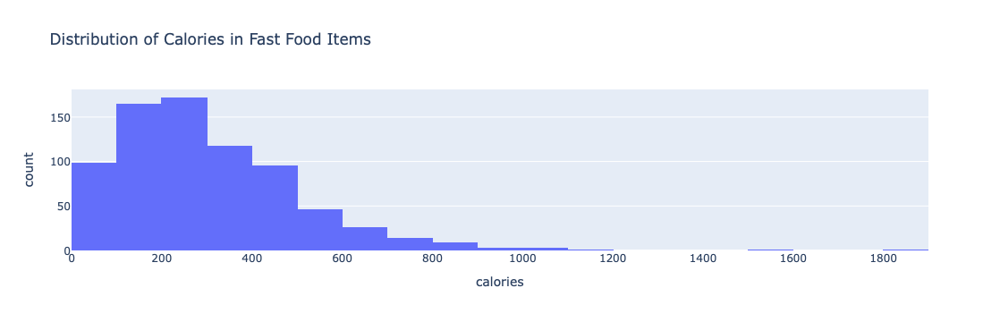

In [52]:
import plotly.express as px

# Create a histogram of calories
fig = px.histogram(df, x='calories', title='Distribution of Calories in Fast Food Items', nbins=30)
fig.show()


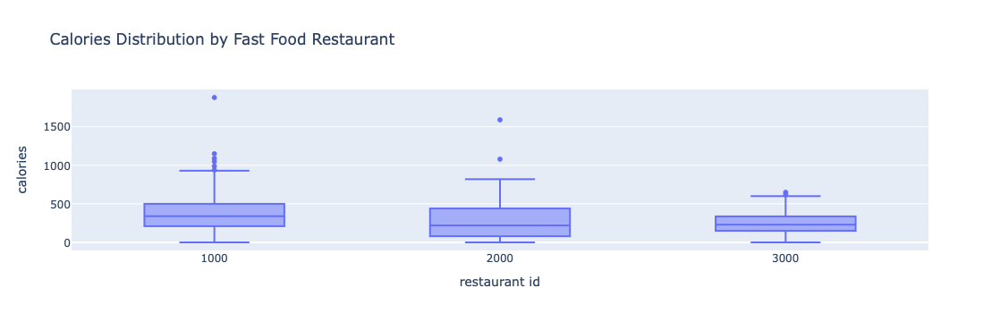

In [54]:
fig = px.box(df, x='restaurant id', y='calories', title='Calories Distribution by Fast Food Restaurant')
fig.show()


In [56]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr = df.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Nutritional Data')
plt.show()


ValueError: could not convert string to float: '3 2'

In [58]:
# Check the data types of the DataFrame
print(df.dtypes)


restaurant id                      int64
category id                        int64
item id                            int64
serving size (oz)                float64
calories                           int64
calories from fat                float64
total fat (g)                     object
total fat (% daily value)        float64
saturated fat (g)                float64
saturated fat (% daily value)    float64
trans fat (g)                    float64
cholesterol (mg)                 float64
cholesterol (% daily value)      float64
sodium (mg)                      float64
sodium (% daily value)           float64
carbohydrates (g)                  int64
carbohydrates (% daily value)    float64
dietary fiber (g)                  int64
dietary fiber (% daily value)    float64
sugars (g)                       float64
protein (g)                      float64
vitamin a (% daily value)        float64
vitamin c (% daily value)        float64
calcium (% daily value)          float64
iron (% daily va

In [60]:
# Identify non-numeric columns
non_numeric_cols = df.select_dtypes(include=['object']).columns
print("Non-numeric columns:", non_numeric_cols)


Non-numeric columns: Index(['total fat (g)'], dtype='object')


In [62]:
# Check the unique values in each non-numeric column
for col in non_numeric_cols:
    print(f"Unique values in {col}:\n", df[col].unique())


Unique values in total fat (g):
 ['13.0' '8.0' '23.0' '28.0' '26.0' '30.0' '20.0' '25.0' '27.0' '31.0'
 '33.0' '37.0' '32.0' '24.0' '21.0' '15.0' '22.0' '35.0' '48.0' '52.0'
 '41.0' '56.0' '60.0' '46.0' '50.0' '9.0' '16.0' '19.0' '4.0' '29.0'
 '43.0' '11.0' '40.0' '17.0' '38.0' '18.0' '10.0' '12.0' '59.0' '118.0'
 '7.0' '4.5' '5.0' '0.0' '2.0' '6.0' '1.5' '2.5' '14.0' '0.5' '3.5' '1.0'
 '3.0' '45.0' '53.0' '65.0' '78.0' '39.0' '54.0' '0.1' '0.2' '6' '0.3' '7'
 '5' '0.4' '9' '4' '2' '8' '3' '11' '0' '1' '10' '15' '13' '3 2']


In [64]:
# Check the unique values in each non-numeric column
for col in non_numeric_cols:
    print(f"Unique values in {col}:\n", df[col].unique())


Unique values in total fat (g):
 ['13.0' '8.0' '23.0' '28.0' '26.0' '30.0' '20.0' '25.0' '27.0' '31.0'
 '33.0' '37.0' '32.0' '24.0' '21.0' '15.0' '22.0' '35.0' '48.0' '52.0'
 '41.0' '56.0' '60.0' '46.0' '50.0' '9.0' '16.0' '19.0' '4.0' '29.0'
 '43.0' '11.0' '40.0' '17.0' '38.0' '18.0' '10.0' '12.0' '59.0' '118.0'
 '7.0' '4.5' '5.0' '0.0' '2.0' '6.0' '1.5' '2.5' '14.0' '0.5' '3.5' '1.0'
 '3.0' '45.0' '53.0' '65.0' '78.0' '39.0' '54.0' '0.1' '0.2' '6' '0.3' '7'
 '5' '0.4' '9' '4' '2' '8' '3' '11' '0' '1' '10' '15' '13' '3 2']


In [66]:
# Convert problematic columns to numeric, coercing errors to NaN
for col in non_numeric_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')


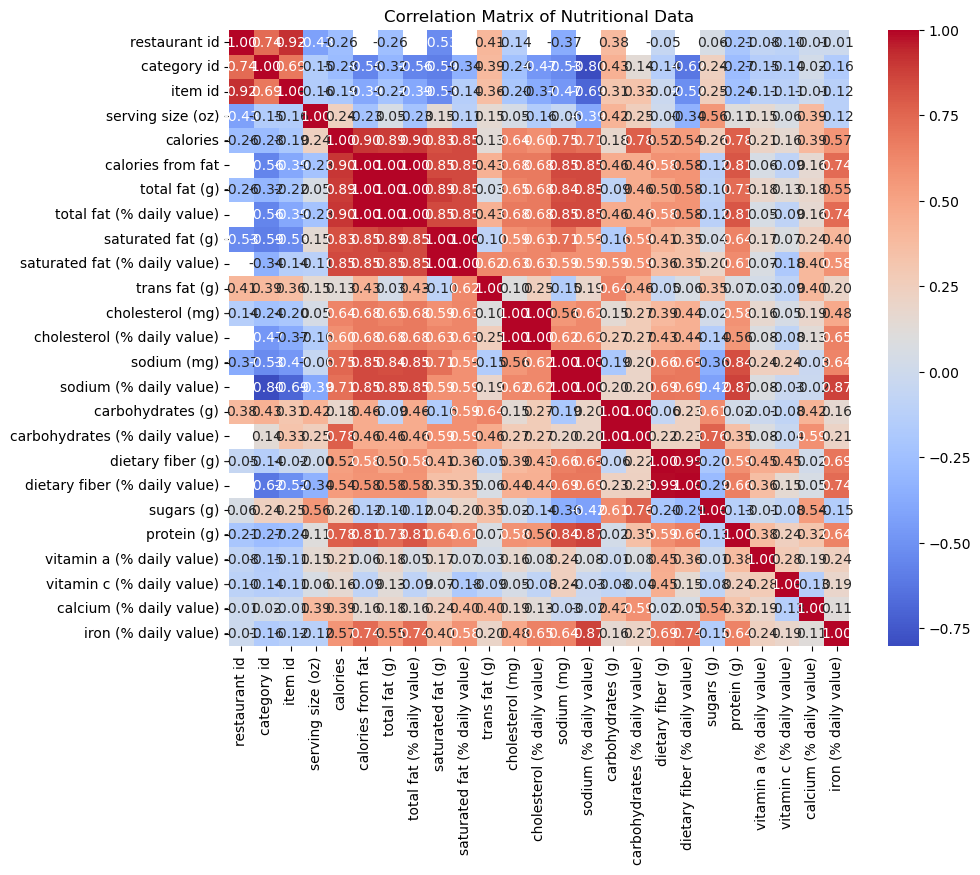

In [68]:
# Calculate the correlation matrix
corr = df.corr()

# Create a heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix of Nutritional Data')
plt.show()


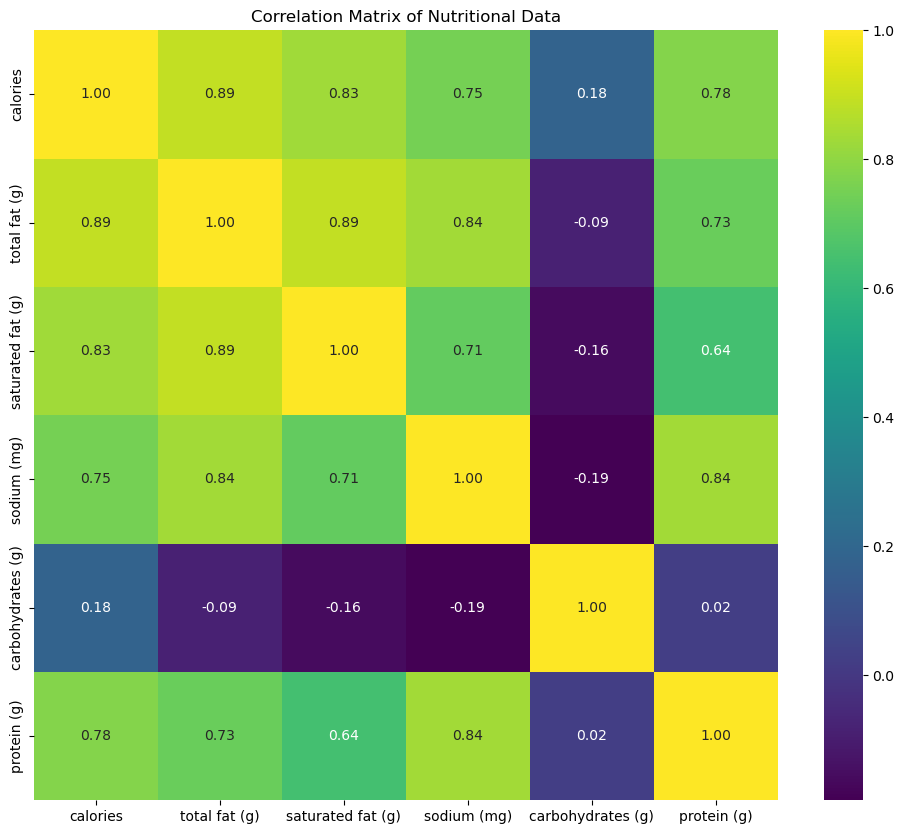

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select a subset of relevant columns for clarity
relevant_columns = ['calories', 'total fat (g)', 'saturated fat (g)', 'sodium (mg)', 'carbohydrates (g)', 'protein (g)']
df_subset = df[relevant_columns]

# Calculate the correlation matrix
corr = df_subset.corr()

# Create a larger heatmap with different color map
plt.figure(figsize=(12, 10))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='viridis')  # Change the color map
plt.title('Correlation Matrix of Nutritional Data')
plt.show()


Summary Statistics:
          calories  saturated fat (g)  sodium (mg)  carbohydrates (g)  \
count   750.000000         637.000000    637.00000         750.000000   
mean    296.149333           3.409105    361.55416          69.574667   
std     209.034366           4.972504    580.64465          65.719590   
min       0.000000           0.000000      0.00000           0.000000   
25%     150.000000           0.000000      5.00000          30.000000   
50%     260.000000           0.200000     80.00000          48.000000   
75%     410.000000           6.000000    480.00000          85.750000   
max    1880.000000          30.000000   3930.00000         340.000000   

       protein (g)  
count   750.000000  
mean     11.398400  
std      11.119111  
min       0.000000  
25%       3.000000  
50%       9.000000  
75%      16.000000  
max     118.000000  


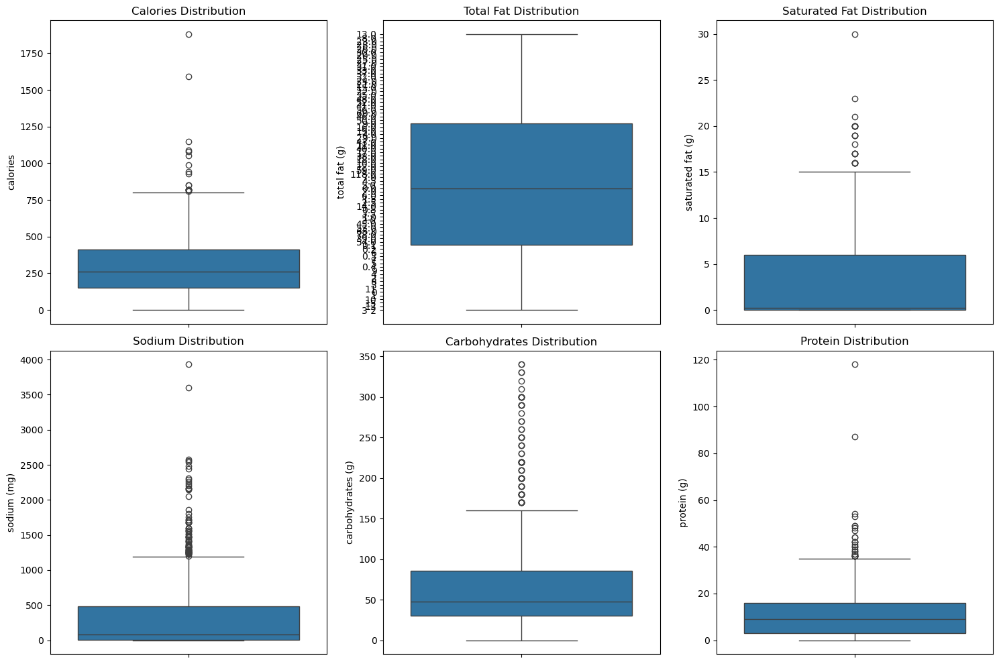

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_csv("https://raw.githubusercontent.com/manuelamc14/fast-food-Nutritional-Database/main/Tables/nutrition.csv")

# Calculate summary statistics for key nutritional metrics
summary_stats = df[['calories', 'total fat (g)', 'saturated fat (g)', 'sodium (mg)', 'carbohydrates (g)', 'protein (g)']].describe()

# Display summary statistics
print("Summary Statistics:")
print(summary_stats)

# Create box plots for each nutritional metric
plt.figure(figsize=(15, 10))

# Box plot for Calories
plt.subplot(2, 3, 1)
sns.boxplot(y=df['calories'])
plt.title('Calories Distribution')

# Box plot for Total Fat
plt.subplot(2, 3, 2)
sns.boxplot(y=df['total fat (g)'])
plt.title('Total Fat Distribution')

# Box plot for Saturated Fat
plt.subplot(2, 3, 3)
sns.boxplot(y=df['saturated fat (g)'])
plt.title('Saturated Fat Distribution')

# Box plot for Sodium
plt.subplot(2, 3, 4)
sns.boxplot(y=df['sodium (mg)'])
plt.title('Sodium Distribution')

# Box plot for Carbohydrates
plt.subplot(2, 3, 5)
sns.boxplot(y=df['carbohydrates (g)'])
plt.title('Carbohydrates Distribution')

# Box plot for Protein
plt.subplot(2, 3, 6)
sns.boxplot(y=df['protein (g)'])
plt.title('Protein Distribution')

plt.tight_layout()
plt.show()


The data sets that we have been provided show us information of the nutritional value for different fast food items. Data for various aspects of the food have been provided, for example, calories, protein, sodium and carbohydrates.

The average calories: 
The average calories for each fast food chain is

1  368.269231

2  289.962963

3 245.681690

It is seen that the chain with the highest average of calories is chain 1, with an average of 368, and the lowest average is 245. As seen in the histogram, the amount of items with calories higher than 500 is very low compared to items with less than that. The graph is right skewed, and I can tell by the tail on the right of the histogram. The item with the highest amount of calories is 1800-1900, there is only one item that is like this. However, there are dozens of items with calories ranging from 0-100. Im assuming these items are drinks with natural ingredients. We can see in the boxplot for calories that there are about a dozen outliers, and these start after about 800 calories. Meaning that almost all the items across the food chains have 800 or less calories.

In the correlation matrix, we can see that the carbohydrates column and row are the only one that has almost no correlation to any of the other nutritional values. We know this because in the heat map, the tiles show they are very low on the heatmap scale, and the tiles also display the correlation values, with most being close to 0. Calories and total fat have the most significant correlation with the rest of the nutritional values. With most of the correlations being 0.8 or higher. What we can take away from this information is that, for example, if two nutritional values have a high correlation, like calories and fat, when the calories are higher the total fat will also be higher.

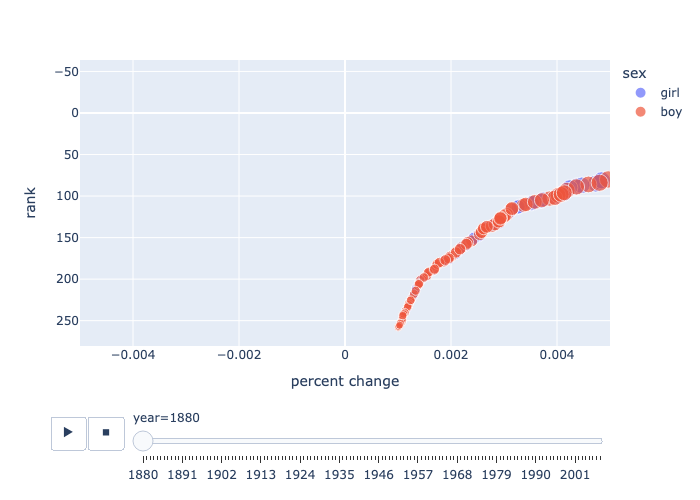

In [92]:
import pandas as pd
import plotly.express as px

# Load the dataset
bn = pd.read_csv('https://raw.githubusercontent.com/hadley/data-baby-names/master/baby-names.csv')

# Make identical boy and girl names distinct
bn['name'] = bn['name'] + " " + bn['sex'] 

# Calculate rank based on percentage
bn['rank'] = bn.groupby('year')['percent'].rank(ascending=False)
bn = bn.sort_values(['name', 'year'])

# Calculate the increase or decrease in name prevalence from the last year
bn['percent change'] = bn['percent'].diff()
new_name = [True] + list(bn.name[:-1].values != bn.name[1:].values)
bn.loc[new_name, 'percent change'] = bn.loc[new_name, 'percent'] 
bn = bn.sort_values('year')

# Restrict to "common" names
bn = bn[bn.percent > 0.001]

# Create the scatter plot
fig = px.scatter(
    bn,
    x="percent change",
    y="rank",
    animation_frame="year",
    animation_group="name",
    size="percent",
    color="sex",
    hover_name="name",
    size_max=50,
    range_x=[-0.005, 0.005]
)

# Update y-axis to reverse the rank order
fig.update_yaxes(autorange='reversed') 

# Show the figure
fig.show(renderer="png") # USE `fig.show(renderer="png")` FOR ALL GitHub and MarkUs SUBMISSIONS


In [94]:
!pip install plotly --upgrade


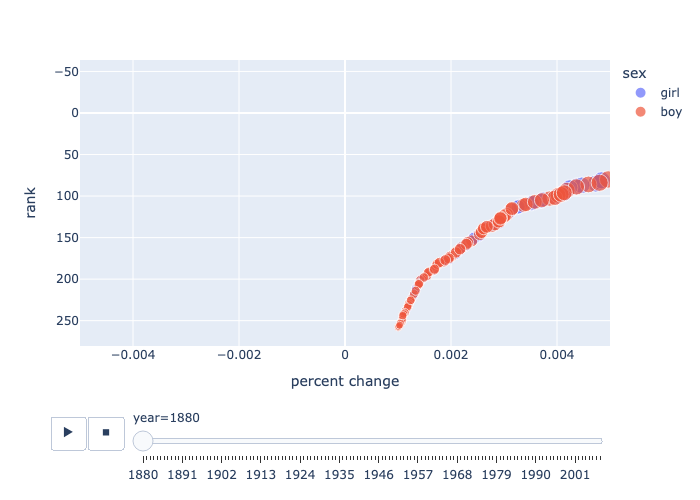

In [96]:
import pandas as pd
import plotly.express as px

# Load the data
bn = pd.read_csv('https://raw.githubusercontent.com/hadley/data-baby-names/master/baby-names.csv')
bn['name'] = bn['name'] + " " + bn['sex']  # Make identical boy and girl names distinct
bn['rank'] = bn.groupby('year')['percent'].rank(ascending=False)
bn = bn.sort_values(['name', 'year'])

# Calculate the percent change
bn['percent change'] = bn['percent'].diff()
new_name = [True] + list(bn.name[:-1].values != bn.name[1:].values)
bn.loc[new_name, 'percent change'] = bn.loc[new_name, 'percent']
bn = bn.sort_values('year')
bn = bn[bn.percent > 0.001]  # Restrict to "common" names

# Create the scatter plot
fig = px.scatter(bn, 
                 x="percent change", 
                 y="rank", 
                 size="percent", 
                 color="sex", 
                 animation_frame="year", 
                 animation_group="name", 
                 hover_name="name",
                 size_max=50, 
                 range_x=[-0.005, 0.005])

fig.update_yaxes(autorange='reversed')  # Reverse y-axis to put rank 1 on top
fig.show(renderer="png")  # Show the plot


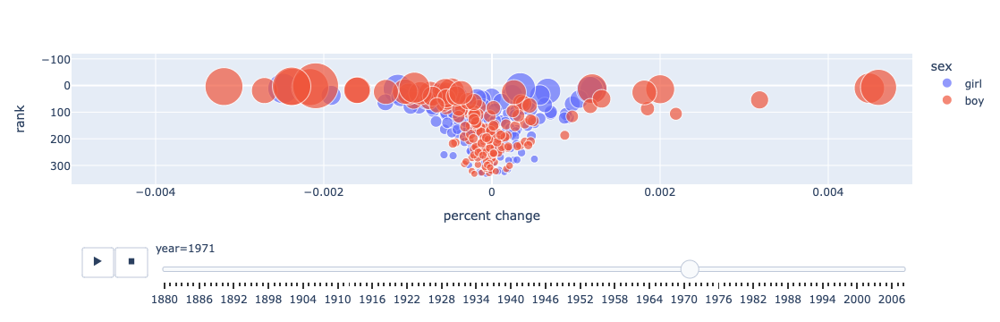

In [98]:
fig.show()


This visual scatterplot, similar to the video we watched, shows us the popularity of baby names for more than a century. You can see that many of the names in the beginning slowly become a much smaller dot, showing that its popularity is declining. Something interesting I noticed is that as the years go by, all the dots become much smaller, even the most popular ones. What I gather from this is that people today are not as interested in using a name for their child that is already VERY popular. There are still popular names, but there is a much wider variety of popular names. Maybe this has to do with parents naming their children after themselves, which isn't as common anymore.

A lot of the traditional names lost their popularity and are no longer as present. I find that very interesting, because that means the names we have now that are popular will soon be considered "Traditional" for the time period we are in.

# Summary of Recent Chats

## Data Visualization with Plotly
- You created a **box plot** and **scatter plot** using Plotly to analyze datasets related to **fast food nutrition** and **baby names**, respectively.
- You expressed interest in understanding the data and the insights derived from the visualizations.

## Statistical Analysis
- We discussed how to analyze the **correlation matrix** in the fast food dataset and interpreted the results, including average calories across different chains and the significance of certain correlations.

## Baby Names Scatter Plot
- You were tasked with creating a scatter plot that visualizes the popularity of baby names over time using the **percent change**, **rank**, and other parameters.
- You encountered issues with the graph not displaying initially but eventually resolved them.

## Analysis of Trends
- You wrote an analysis of the scatter plot, highlighting trends in baby name popularity, the decline of traditional names, and the shift towards more unique names in contemporary culture.

## Homework and Coding Assistance
- You requested assistance with Python code for your homework and how to analyze the output effectively, including the creation of visualizations and interpreting the results.

## Clarification and Guidance
- You sought clarification on specific coding tasks and how to articulate your findings based on the visualizations you created.


https://chatgpt.com/share/66f5d82d-52ec-8012-b2fc-9fd7208dc708